In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

import lane_detection
import utils

%matplotlib inline

In [2]:
image_folder_name = 'test_image'

In [3]:
image_paths = utils.get_list_of_input_files(image_folder_name, "jpg")
images = [cv2.imread(image_path) for image_path in image_paths]

<H3>Imported images in BGR<H3>

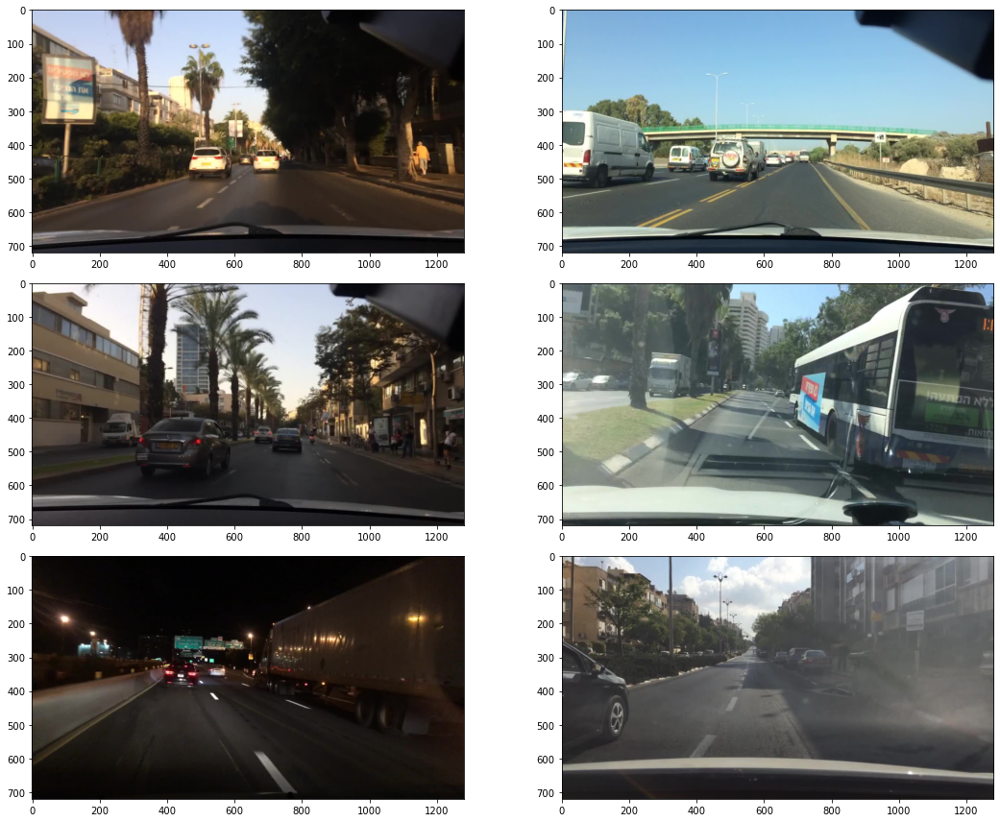

In [4]:
utils.show_images(images, cmap='bgr')

<H3>Images split in Channels<H3>
          1.Blue                                          2.Green                                          3.Red

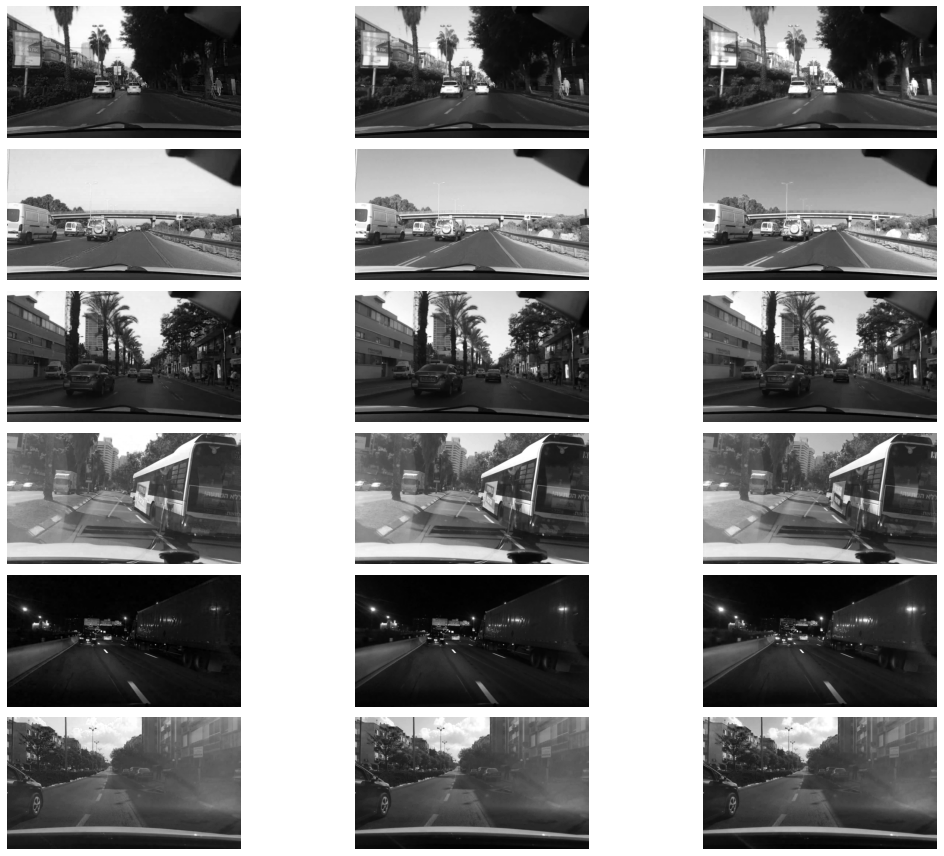

In [6]:
utils.show_images(images, channels=True)

<H3>Images converted to HLS space<H3>

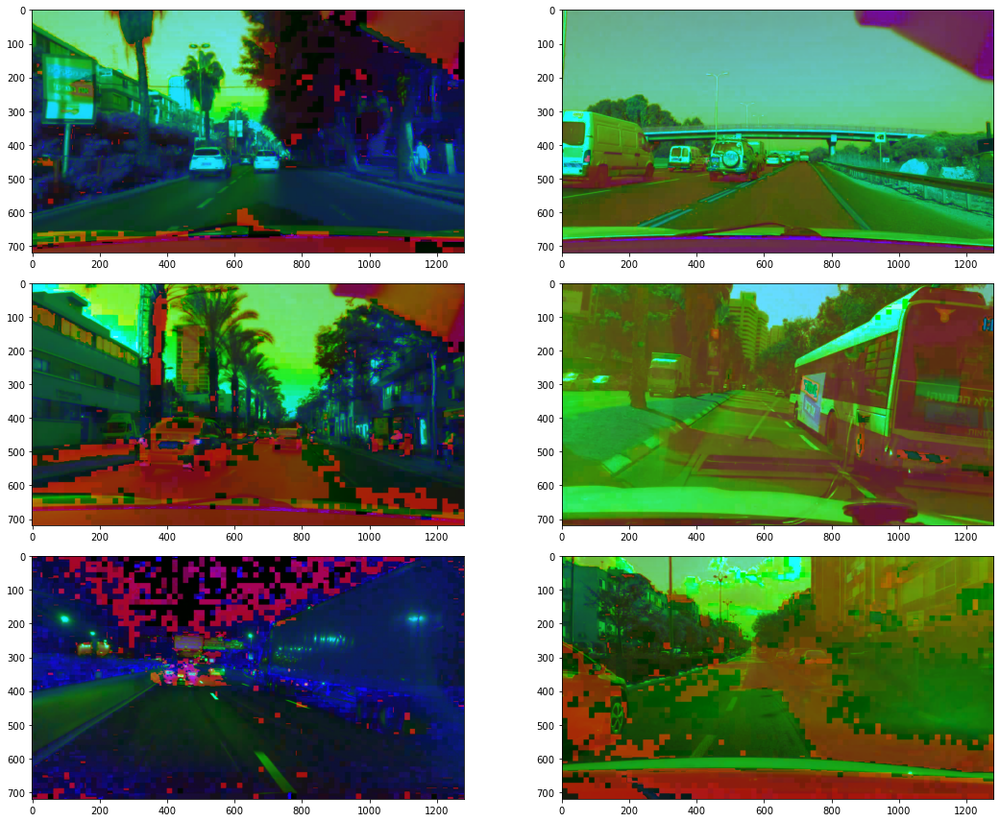

In [10]:
def bgr_to_hls(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2HLS)

utils.show_images(list(map(bgr_to_hls, images)))

<H3>Images split in Channels<H3>
1.Hue 2.Lightness 3.Saturation

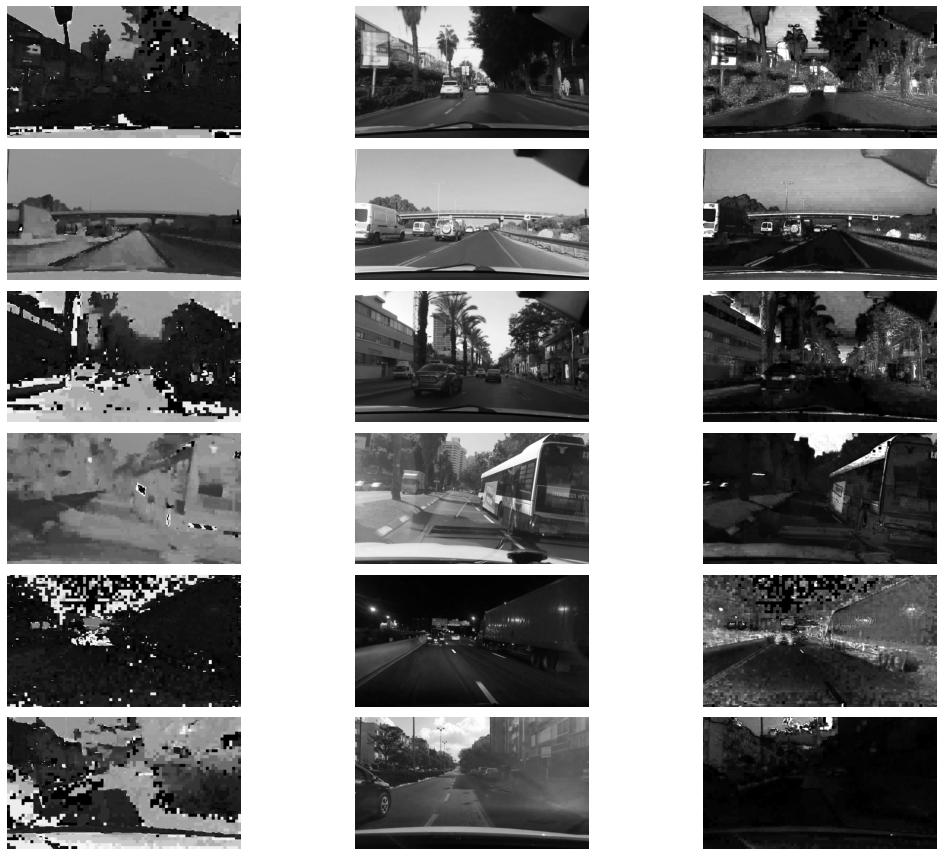

In [12]:
def bgr_to_hls(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2HLS)

utils.show_images(list(map(bgr_to_hls, images)), channels=True)

<H3>Images converted to HSV space<H3>

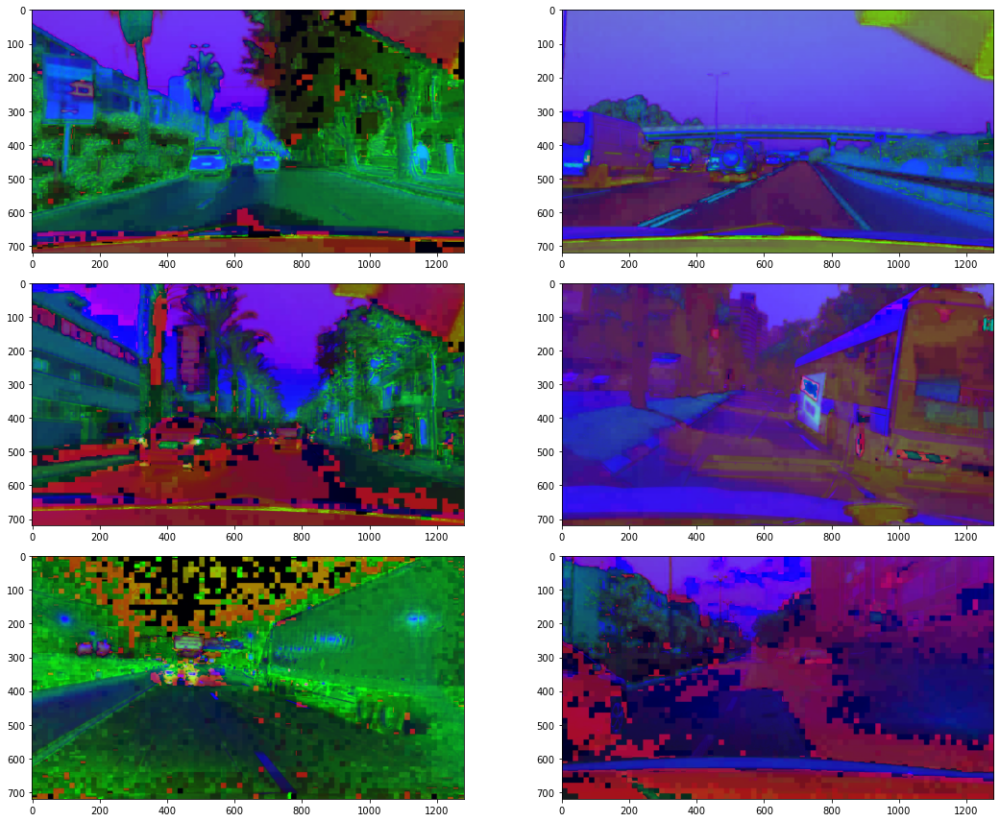

In [13]:
def bgr_to_hsv(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

utils.show_images(list(map(bgr_to_hsv, images)))

<H3>Images split in Channels<H3>
1.Hue 2.Saturation 3.Value

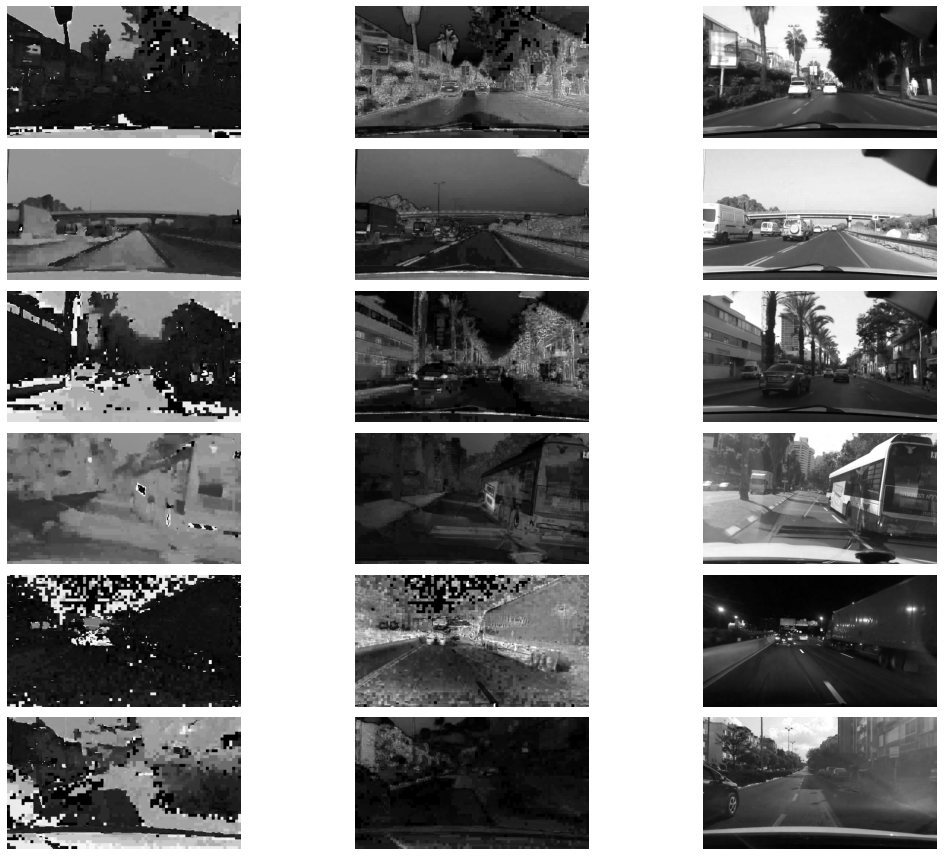

In [15]:
def bgr_to_hsv(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

utils.show_images(list(map(bgr_to_hsv, images)), channels=True)

<H3>Images converted to LUV space<H3>

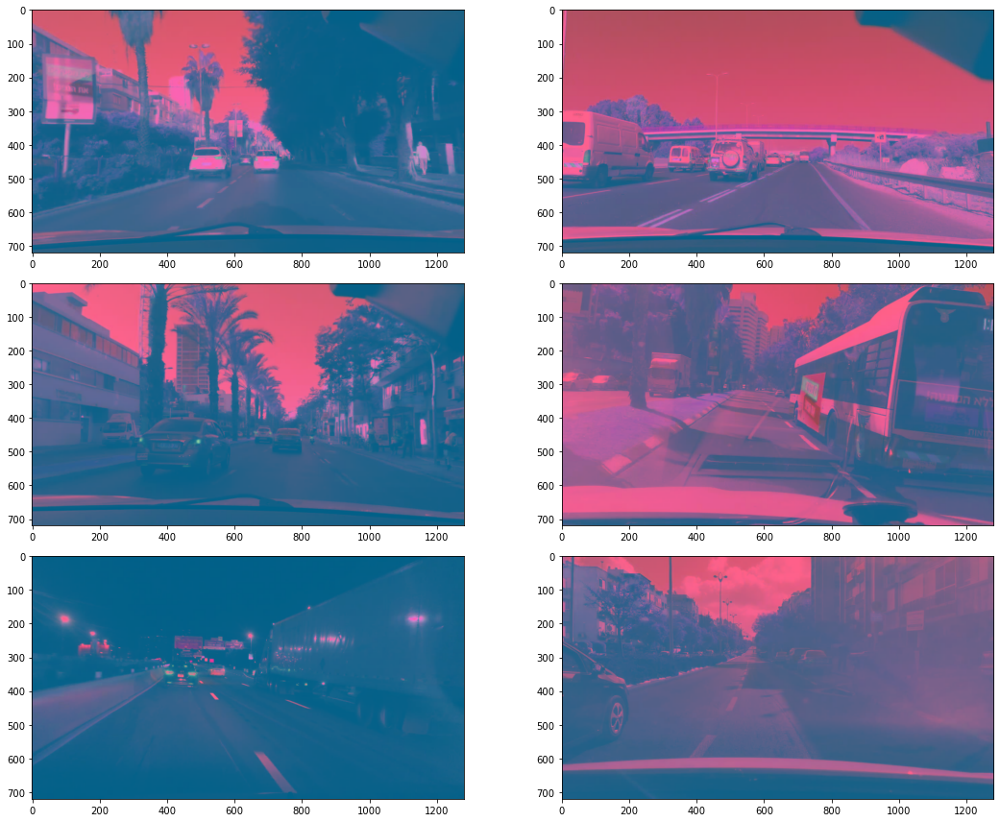

In [16]:
def bgr_to_luv(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2LUV)

utils.show_images(list(map(bgr_to_luv, images)))

<H3>Images split in Channels<H3>
1.L 2.U 3.V

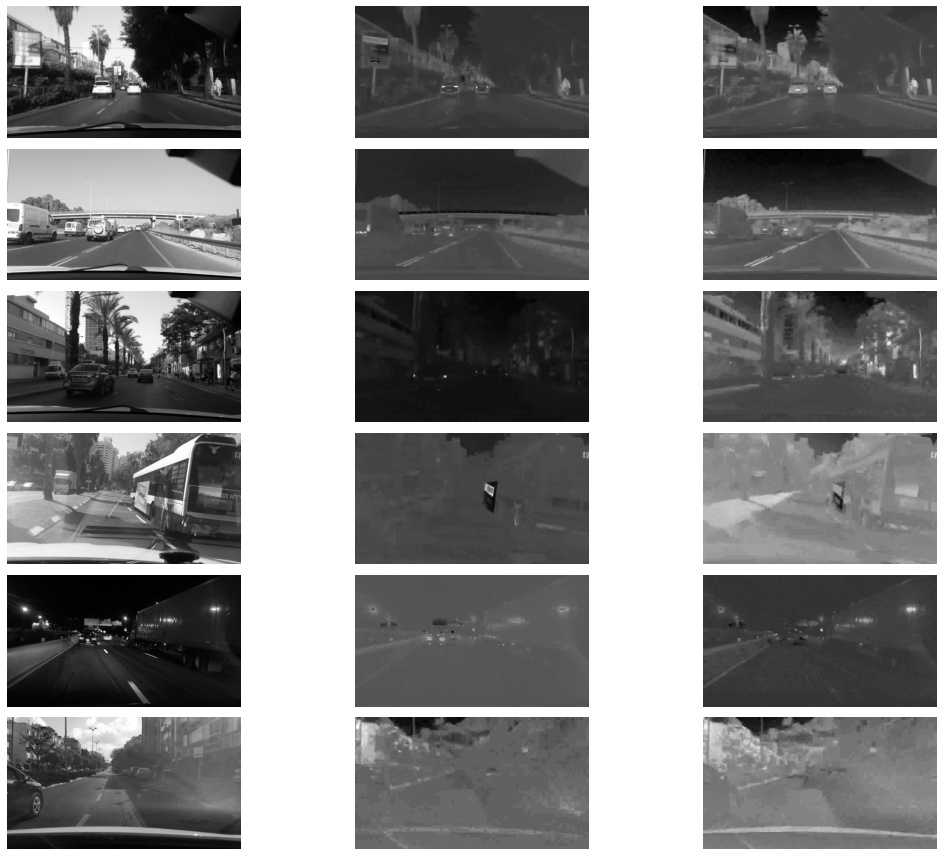

In [17]:
def bgr_to_luv(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2LUV)

utils.show_images(list(map(bgr_to_luv, images)), channels=True)

<H3>Images converted to YUV space<H3>

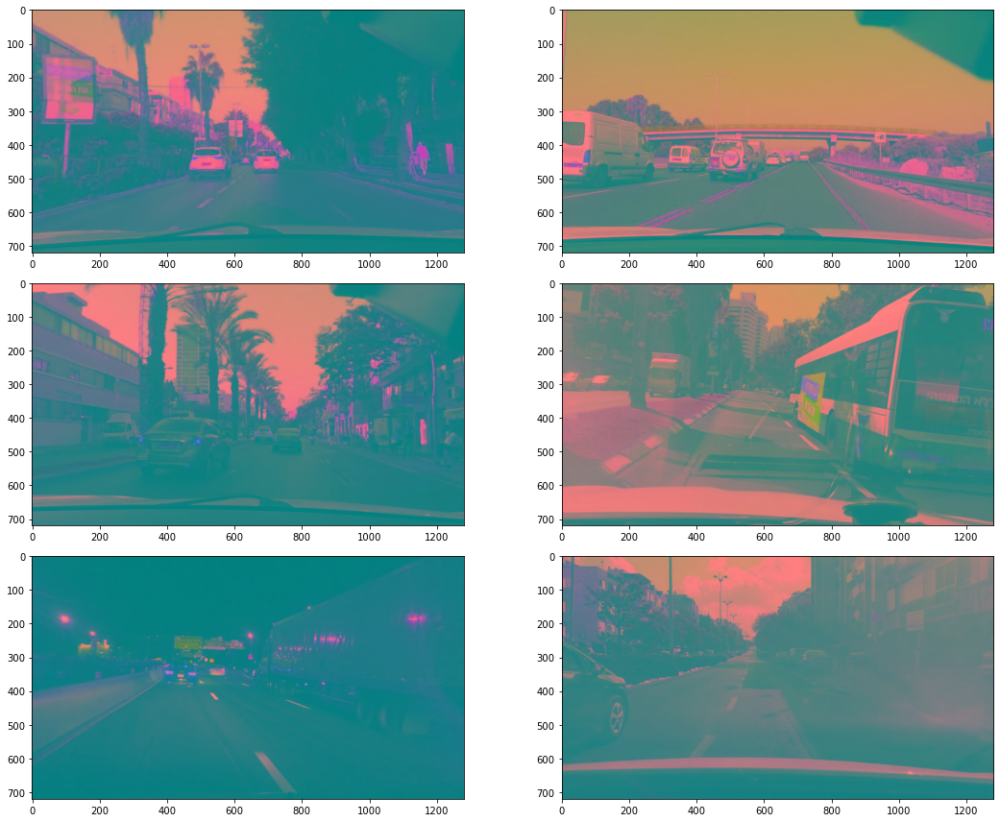

In [19]:
def bgr_to_yuv(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2YUV)

utils.show_images(list(map(bgr_to_yuv, images)))

<H3>Images split in Channels<H3>
1.Y 2.U 3.V

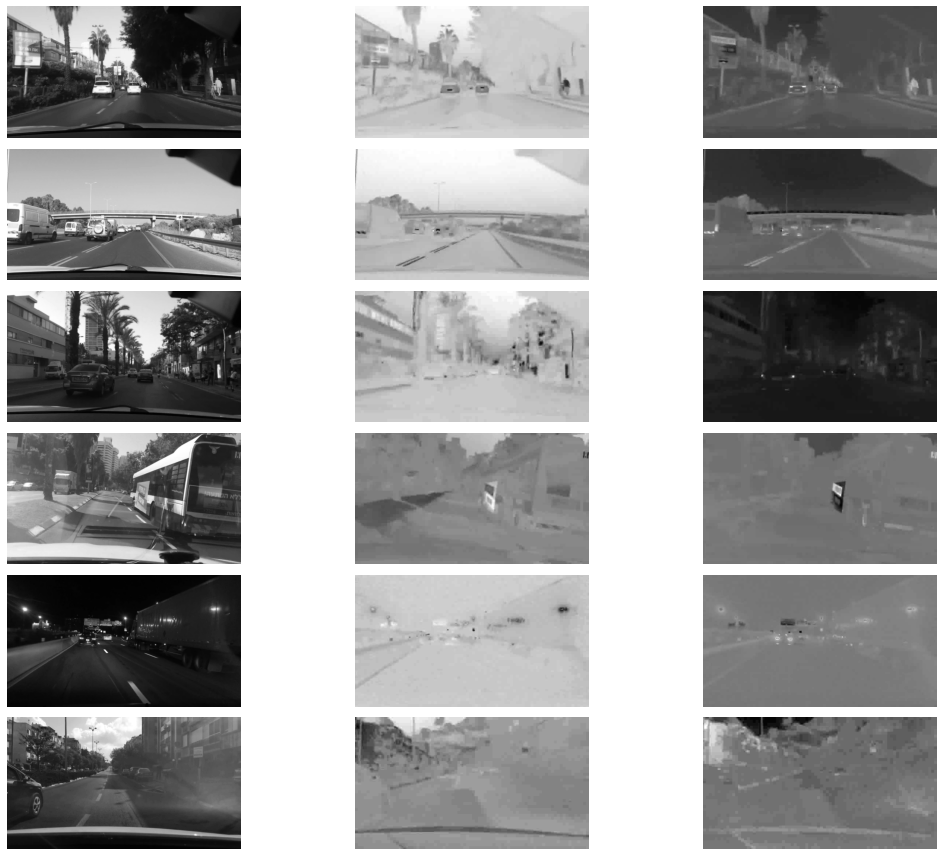

In [20]:
def bgr_to_yuv(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2YUV)

utils.show_images(list(map(bgr_to_yuv, images)), channels=True)

<H3>Images converted to LAB space<H3>

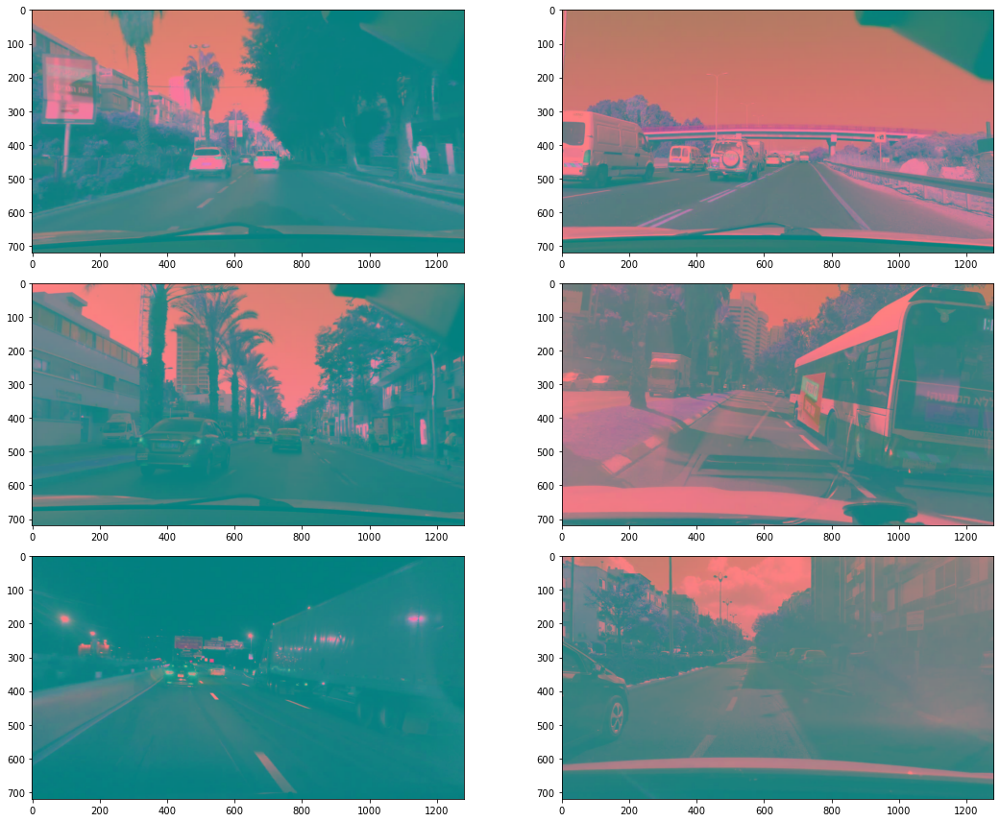

In [30]:
def bgr_to_lab(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)

utils.show_images(list(map(bgr_to_lab, images)))

<H3>Images split in Channels<H3>
1.L 2.A 3.B

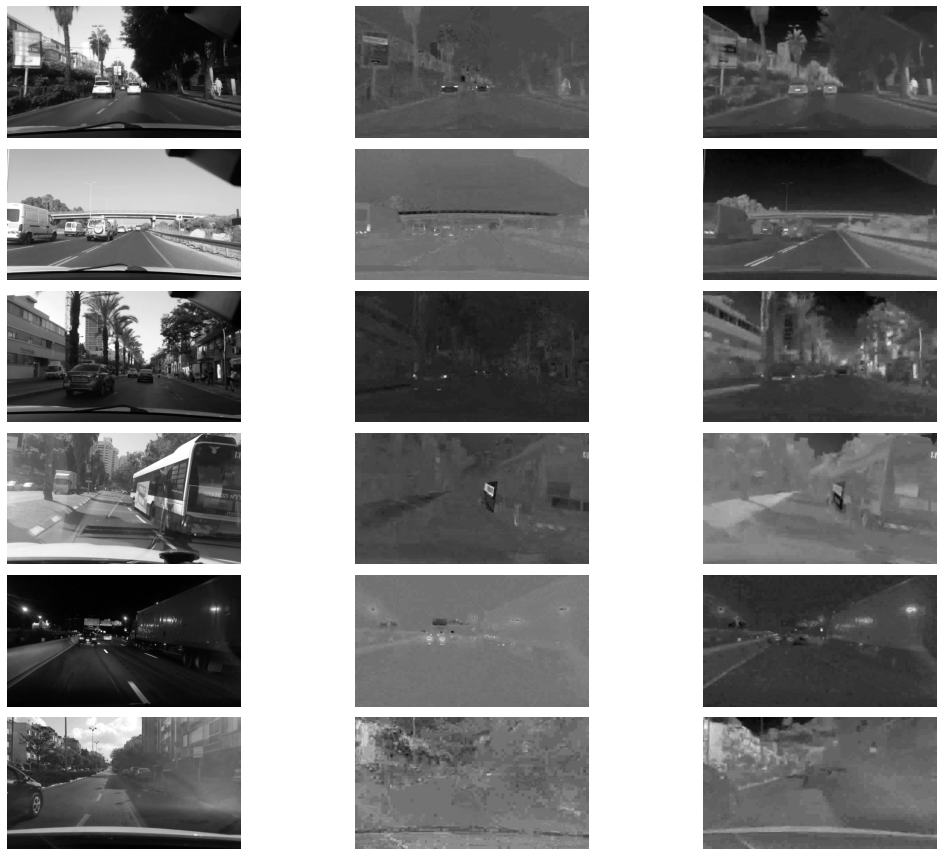

In [31]:
def bgr_to_lab(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)

utils.show_images(list(map(bgr_to_lab, images)), channels=True)

<H3> Create mask to detect white and yellow lanes<H3>

In [26]:
def create_channel_mask(channel, threshold):
    return cv2.inRange(channel, threshold[0], threshold[1])

<H3>BGR - Red channel<H3>

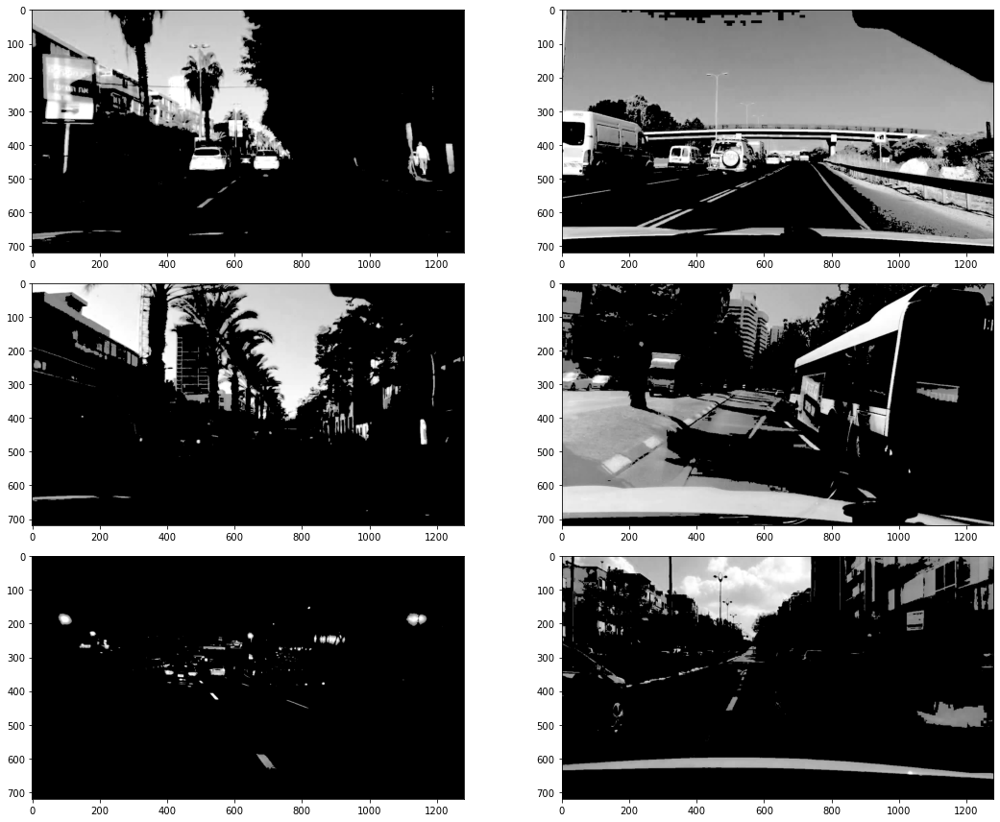

In [28]:
def create_bgr_lane_mask(frame):
    # Select channel red
    mask = create_channel_mask(frame[:, :, 2], (125, 255))
    return cv2.bitwise_and(frame[:, :, 2], frame[:, :, 2], mask=mask)

utils.show_images(list(map(create_bgr_lane_mask, images)))

<H3>HLS - Ligthness<H3>

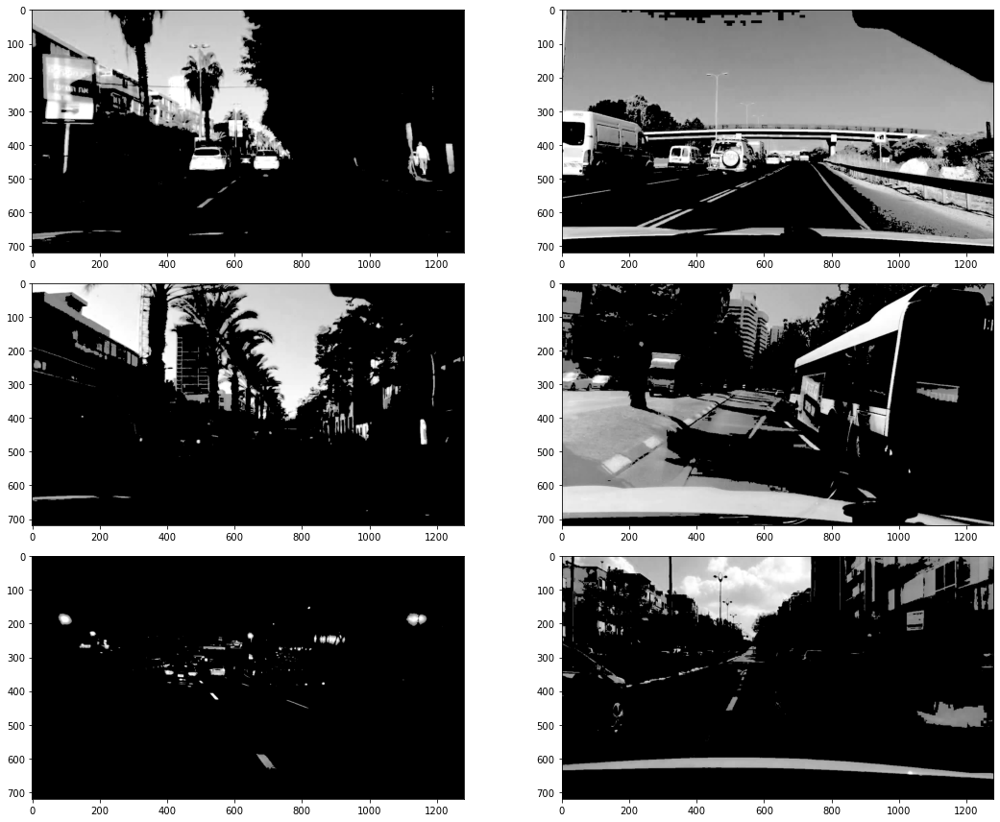

In [70]:
def create_hls_lane_mask(frame):
    # Select channel lightness
    hls_frame = bgr_to_hls(frame)
    mask = create_channel_mask(hls_frame[:, :, 1], (125, 255))
    return cv2.bitwise_and(frame[:, :, 2], frame[:, :, 2], mask=mask)

lanes = list(map(create_bgr_lane_mask, images))
utils.show_images(lanes)

<H3>HSV - Value<H3>

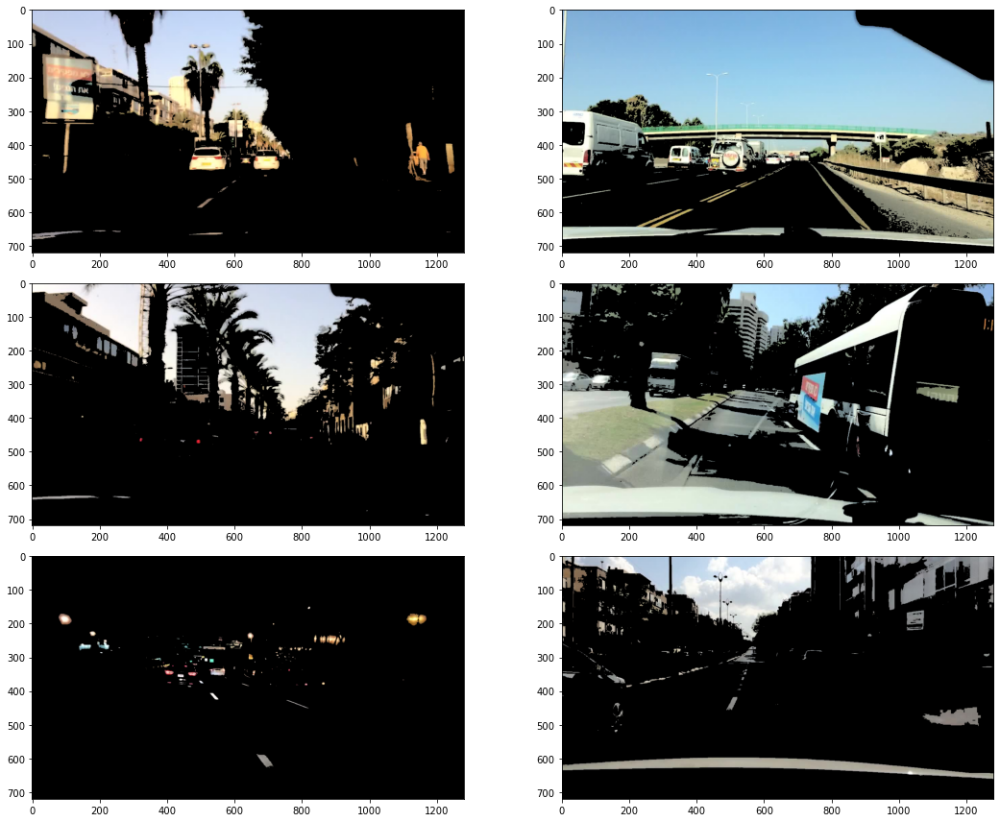

In [45]:
def create_hsv_lane_mask(frame):
    # Select channel value
    hsv_frame = bgr_to_hsv(frame)
    mask = create_channel_mask(hsv_frame[:, :, 2], (130, 255))
    return cv2.bitwise_and(frame, frame, mask=mask)

utils.show_images(list(map(create_hsv_lane_mask, images)), 'bgr')

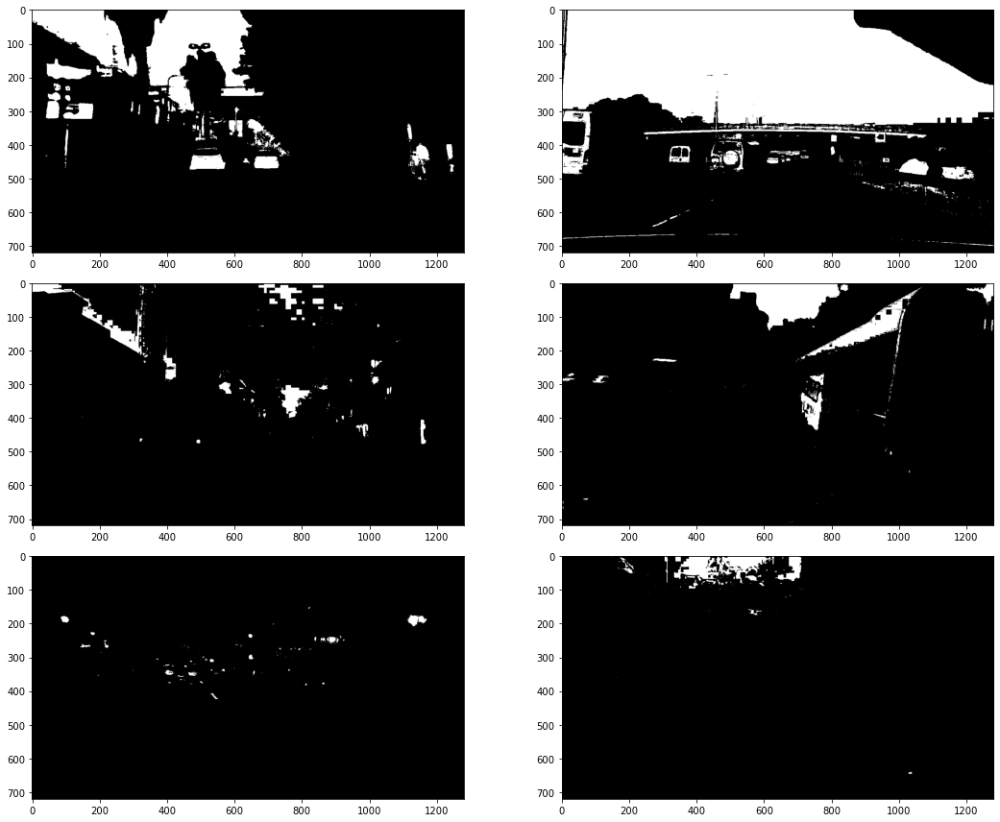

In [68]:
def calculate_threshold(frame, thresholds):
    return cv2.threshold(frame, thresholds[0], thresholds[1], cv2.THRESH_BINARY)

def create_binary_lane_mask(frame):
    hls_frame = bgr_to_hls(frame)
    _, saturation_threshold = calculate_threshold(hls_frame[:, :, 1], (80, 255))
    _, red_threshold = calculate_threshold(hls_frame[:, :, 2], (120, 255))
    return cv2.bitwise_and(saturation_threshold, red_threshold)

utils.show_images(list(map(create_binary_lane_mask, images)))

<H3>Edge Detection<H3>

In [82]:
def apply_gaussian_blur(frame, kernel=(5, 5)):
    return cv2.GaussianBlur(frame, kernel, 0)

def bgr_to_gray(frame):
    return cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
def apply_sobel_edge_detection(frame):
    #frame = bgr_to_gray(frame)
    frame = apply_gaussian_blur(frame)
    
    # For x direction
    sobel_x = cv2.Sobel(frame, cv2.CV_64F, 1, 0)
    # For y direction
    sobel_y = cv2.Sobel(frame, cv2.CV_64F, 0, 1)
    # Calculate filtered matrix
    grad = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    return (grad * 255 / grad.max()).astype(np.uint8)

def apply_canny_edge_det(frame, thresholds=(30, 150)):
    #gray  = bgr_to_gray(frame)
    frame = apply_gaussian_blur(frame)
    return cv2.Canny(frame, thresholds[0], thresholds[1])

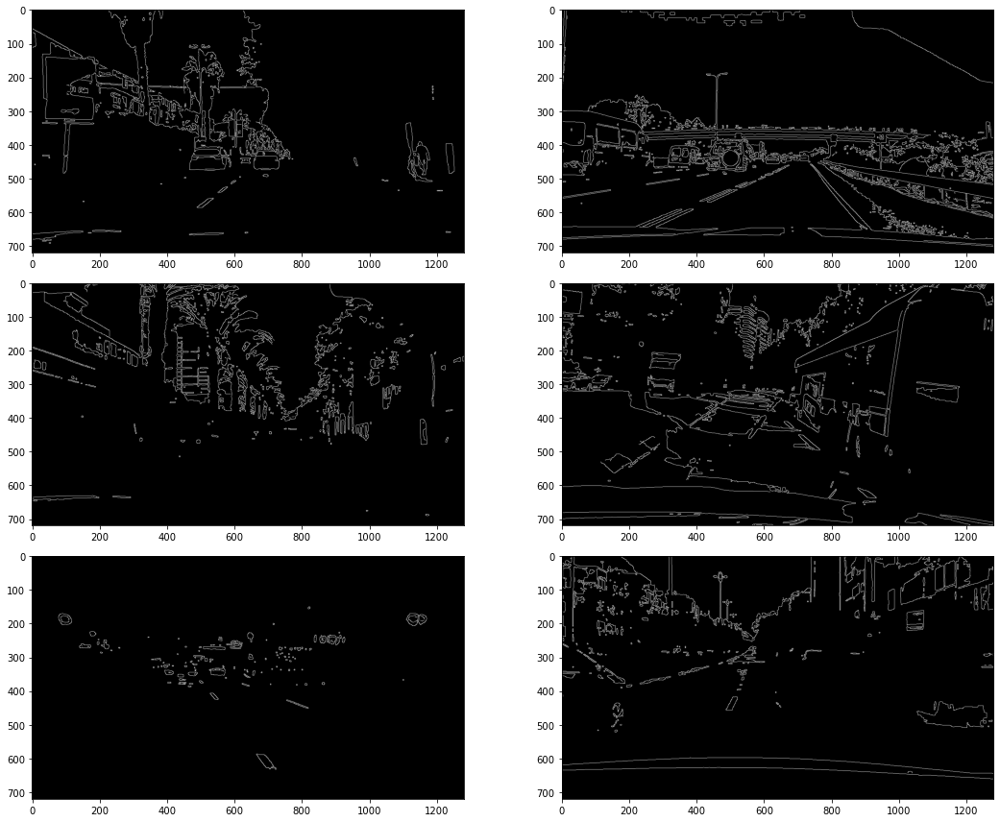

In [84]:
utils.show_images(list(map(apply_canny_edge_det, lanes)))

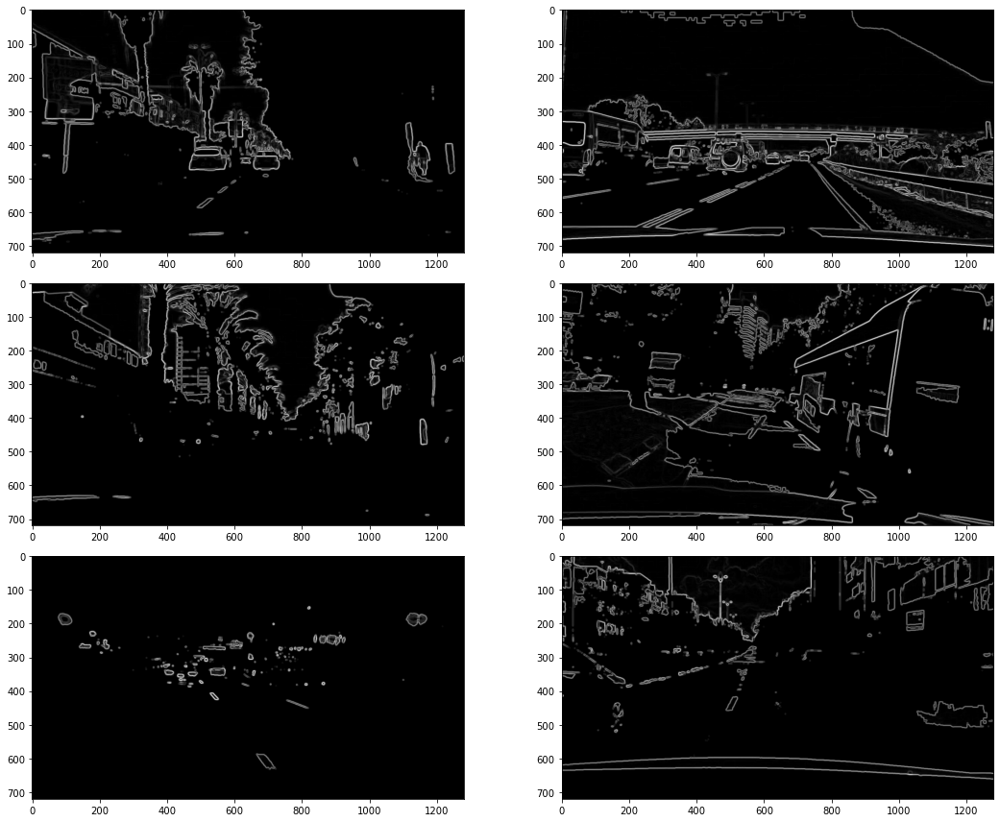

In [75]:
edges = list(map(apply_sobel_edge_detection, lanes))
utils.show_images(edges)

In [76]:
#def combine_edge_lane():
#    return cv2.bitwise_and(lanes, edges)

#utils.show_images(list(map(apply_canny_edge_det, images)))

Todo Tranform, Draw lines